In [1]:
import numpy as np
import time
import os
import cv2
import sys

# Now cluster the data

%pylab inline
import os
import keras
import cv2
import time
import numpy as np
import pandas as pd
import keras.backend as K
import tensorflow as tf

import sklearn.metrics as metrics

from keras import callbacks
from keras.models import Model
from keras.optimizers import SGD
from keras.initializers import VarianceScaling
from keras.engine.topology import Layer, InputSpec
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, Conv2DTranspose, Flatten
from keras.layers import Reshape, UpSampling2D, BatchNormalization, Cropping2D, Concatenate
from keras.callbacks import ModelCheckpoint, EarlyStopping


os.getcwd()
home_dir = os.path.abspath('../../../')
data_dir = os.path.join(home_dir, 'data', 'ua_detrac',  'DETRAC-Images')
data_dir

home_dir

filter_path = os.path.join(home_dir, 'filters')
loader_path = os.path.join(home_dir, 'loaders')

sys.path.append(home_dir)
sys.path.append(loader_path)
sys.path.append(filter_path)

Populating the interactive namespace from numpy and matplotlib


Using TensorFlow backend.


In [2]:
import sys
print(sys.executable)

/nethome/jbang36/anaconda3/envs/eva_37/bin/python


In [3]:
# Load the data
from loaders.load import Load

start_time = time.time()
load = Load()

eva_dir = home_dir
image_dir = os.path.join(eva_dir, "data", "ua_detrac", "small-data")
anno_dir = os.path.join(eva_dir, "data", "ua_detrac", "small-annotations")

X, length_per_mvi = load.load_images(image_dir, grayscale = False)
Y_dict = load.load_XML(anno_dir, X, length_per_mvi)

print("Total time to load small data is", time.time() - start_time, "seconds")

  0%|          | 0/10427 [00:00<?, ?it/s]

image directory is  /home/jbang36/eva/data/ua_detrac/small-data
Length of file_names: 10427


error: OpenCV(4.1.0) ../modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [3]:

def _split_train_test(X,Y_dict):
    n_samples, _, _, _= X.shape
    train_index_end = int(len(X) * 0.8)

    X_train = X[:train_index_end]
    X_test = X[train_index_end:]

    Y_dict_train = {}
    Y_dict_test = {}
    for column in Y_dict:
        Y_dict_train[column] = Y_dict[column][:train_index_end]
        Y_dict_test[column] = Y_dict[column][train_index_end:]

    return X_train, X_test, Y_dict_train, Y_dict_test

X_train, X_test, Y_train_dict, Y_test_dict = _split_train_test(X, Y_dict)


In [4]:

X_train_norm = np.copy(X_train)
X_test_norm = np.copy(X_test)

def _format_image_fixed(X, height, width):
    n_samples,_,_,channels = X.shape
    X_new = np.ndarray(shape=(n_samples, height, width, channels))
    for i in range(n_samples):
        X_new[i] = cv2.resize(X[i],  (width,height))
    
    X_new /= 255.0
        
    return X_new


def _format_image(X, sampling_rate=12):
    print("before:", X.shape)
    reduction_rate = sampling_rate
    # need to down shape them so that the kernels can train faster
    # image should be num_samples, height, width, channel
    downsampled_images = X[:, ::reduction_rate, ::reduction_rate, :]
    downsampled_images = downsampled_images.astype(np.float32)
    print("After change, shape of image is", downsampled_images.shape)
    downsampled_images /= 255.0
    return downsampled_images

X_train_norm = _format_image_fixed(X_train_norm, 40, 80)
X_test_norm = _format_image_fixed(X_test_norm, 40, 80)



40 80 3


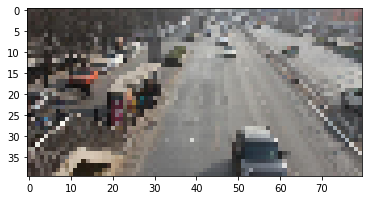

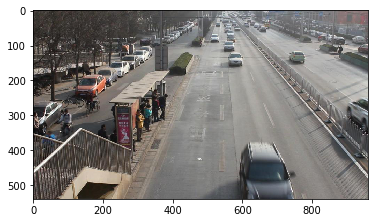

In [5]:

example = X_train_norm[0]
width, height, channels = example.shape
print(width, height, channels)
example = example * 255.0
example = example.astype(np.uint8)



plt.imshow(example)
plt.show()


plt.imshow(X_train[0])
plt.show()



In [6]:
import torch
import torchvision as tv
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision.utils import save_image

In [7]:
import gc
gc.collect()


torch.cuda.empty_cache() 
os.environ["CUDA_VISIBLE_DEVICES"]="0"
torch.cuda.set_device(0)

In [8]:


# Writing our model
class unet_seg(nn.Module):
    def __init__(self):
        super(unet_seg,self).__init__()
        
        self.K = 10
        self.output_channels = 3
        self.input_channels = 3
        
        self.create_enc()
        
        
    def forward(self,x):
        x1 = self.u_enc1(x)
        x2 = self.u_enc2(x1)
        x3 = self.u_enc3(x2)
        x4 = self.u_enc4(x3)
        x34 = torch.cat([x3,x4], dim = 1)
        x5 = self.u_enc5( x34 )
        x25 = torch.cat([x2,x5], dim = 1)
        x6 = self.u_enc6( x25 )
        x16 = torch.cat([x1,x6], dim = 1)
        x7 = self.u_enc7( x16 ) #reconstructed
        x8 = self.u_enc_seg( x16 ) #segmented
        
        return [x7,x8]
    
    
    def create_enc(self):
        self.u_enc1 = nn.Sequential()
        self.u_enc1.add_module('Conv1_1', nn.Conv2d(self.input_channels, 16, kernel_size=3, padding = (1,1)))
        self.u_enc1.add_module('Relu1_2', nn.ReLU(True))
        self.u_enc1.add_module('Conv1_3', nn.Conv2d(16,16,kernel_size=3, padding = (1,1)))
        self.u_enc1.add_module('Relu1_4', nn.ReLU(True))
        
        self.u_enc2 = nn.Sequential()
        self.u_enc2.add_module('Max2_1', nn.MaxPool2d(2, stride = 2))
        self.u_enc2.add_module('Conv2_2', nn.Conv2d(16, 32, kernel_size=3, padding = (1,1)))
        self.u_enc2.add_module('Relu2_3', nn.ReLU(True))
        self.u_enc2.add_module('Conv2_4', nn.Conv2d(32, 32, kernel_size=3, padding = (1,1)))
        self.u_enc2.add_module('Relu2_5', nn.ReLU(True))
        
        self.u_enc3 = nn.Sequential()
        self.u_enc3.add_module('Max3_1', nn.MaxPool2d(2, stride = 2))
        self.u_enc3.add_module('Conv3_2', nn.Conv2d(32, 64, kernel_size=3, padding = (1,1)))
        self.u_enc3.add_module('Relu3_3', nn.ReLU(True))
        self.u_enc3.add_module('Conv3_4', nn.Conv2d(64, 64, kernel_size=3, padding = (1,1)))
        self.u_enc3.add_module('Relu3_5', nn.ReLU(True))
        
        self.u_enc4 = nn.Sequential()
        self.u_enc4.add_module('Max4_1', nn.MaxPool2d(2, stride = 2))
        self.u_enc4.add_module('Conv4_2', nn.Conv2d(64, 128, kernel_size=3, padding = (1,1)))
        self.u_enc4.add_module('Relu4_3', nn.ReLU(True))
        self.u_enc4.add_module('Conv4_4', nn.Conv2d(128, 128, kernel_size=3, padding = (1,1)))
        self.u_enc4.add_module('Relu4_5', nn.ReLU(True))
        self.u_enc4.add_module('CT4_6', nn.ConvTranspose2d(128, 64, kernel_size = 2, stride = 2))
        
        self.u_enc5 = nn.Sequential()
        self.u_enc5.add_module('Conv5_1', nn.Conv2d(128, 64, kernel_size=3, padding = (1,1)))
        self.u_enc5.add_module('Relu5_2', nn.ReLU(True))
        self.u_enc5.add_module('Conv5_3', nn.Conv2d(64, 64, kernel_size=3, padding = (1,1)))
        self.u_enc5.add_module('Relu5_4', nn.ReLU(True))
        self.u_enc5.add_module('CT5_5', nn.ConvTranspose2d(64, 32, kernel_size = 2, stride = 2))
        
        self.u_enc6 = nn.Sequential()
        self.u_enc6.add_module('Conv6_1', nn.Conv2d(64, 32, kernel_size=3, padding = (1,1)))
        self.u_enc6.add_module('Relu6_2', nn.ReLU(True))
        self.u_enc6.add_module('Conv6_3', nn.Conv2d(32, 32, kernel_size=3, padding = (1,1)))
        self.u_enc6.add_module('Relu6_4', nn.ReLU(True))
        self.u_enc6.add_module('CT6_5', nn.ConvTranspose2d(32, 16, kernel_size = 2, stride = 2))
        
        self.u_enc7 = nn.Sequential()
        self.u_enc7.add_module('Conv7_1', nn.Conv2d(32, 16, kernel_size=3, padding = (1,1)))
        self.u_enc7.add_module('Relu7_2', nn.ReLU(True))
        self.u_enc7.add_module('Conv7_3', nn.Conv2d(16, 16, kernel_size=3, padding = (1,1)))
        self.u_enc7.add_module('Relu7_4', nn.ReLU(True))
        self.u_enc7.add_module("Conv7_5", nn.Conv2d(16, self.output_channels, kernel_size = 1))
        self.u_enc7.add_module('Relu7_6', nn.ReLU(True))
        
        self.u_enc_seg = nn.Sequential()
        self.u_enc_seg.add_module('Conv8_1', nn.Conv2d(32,16, kernel_size=3, padding = (1,1)))
        self.u_enc_seg.add_module('Relu8_2', nn.ReLU(True))
        self.u_enc_seg.add_module('Conv8_3', nn.Conv2d(16, 16, kernel_size=3, padding = (1,1)))
        self.u_enc_seg.add_module('Relu8_4', nn.ReLU(True))
        self.u_enc_seg.add_module('Conv8_5', nn.Conv2d(16, self.K, kernel_size = 1))
        self.u_enc_seg.add_module('Soft8_6', nn.Softmax())
        

In [9]:
model = unet_seg().cuda()
distance = nn.MSELoss()

# Loss Function Revision

batch_size = 512
n_samples, H, W, C = X_train_norm.shape

train_data = torch.from_numpy(X_train_norm).float()
train_data = train_data.permute(0,3,1,2)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=batch_size, num_workers=4, drop_last=True)

#dist_diff_matrix = calculate_dist_matrix(batch_size, H,W)

In [ ]:
## Paper training stats
# learning_rate = 0.003
# dropout rate is 0.65
# batch size is 10
# learning rate dropped by 10 every 1000 iteration
# training stopped at 50000 iterations (assuming this is epoch)
learning_rate = 0.0001 # our loop starts by dividing 10
total_epochs = 300



optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
#optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate, momentum=0.9)
for epoch in range(total_epochs):
 #   if epoch % 1000 == 0:
 #       optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate, momentum=0.9)
    
    st = time.perf_counter()
    for i, images in enumerate(train_loader):    # Ignore image labels
        images_cuda = images.cuda()
        recon, seg = model(images_cuda)  
        #print_grad("Before zero_grad") ##

        optimizer.zero_grad()
        #print_grad("After zero_grad") ##
        
        loss2 = distance(recon, images_cuda)
        loss2.backward()
        #print_grad("After 2nd loss backward")
        optimizer.step()
        #print_grad("After 2nd grad application")

    print('epoch [{}/{}], loss2:{:.4f}, time elapsed:{:.4f} (sec)'.format(epoch+1, total_epochs, loss2.data, time.perf_counter() - st))


In [11]:
X_test_torch = torch.from_numpy(X_test_norm[0:10]).float()
test_data = X_test_torch.permute(0,3,1,2)
test_cuda = test_data.cuda()
recon, seged = model(test_cuda)

recon_p = recon.permute(0,2,3,1)
print(recon_p.size())
recon_imgs = recon_p.detach().cpu().numpy()
recon_imgs *= 255
recon_imgs = recon_imgs.astype(np.uint8)

# Try to visualize segmented image
print(torch.max(seged))
print(torch.min(seged))

N,K,H,W = seged.size()

arged = torch.argmax(seged, dim = 1) #channels is 1
arged = arged * 255 / (K - 1)
arged_imgs = arged.detach().cpu().numpy()

print(recon_p.size())

arged_imgs = arged_imgs.astype(np.uint8)

torch.Size([10, 40, 80, 3])
tensor(0.1297, device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0.0744, device='cuda:0', grad_fn=<MinBackward1>)
torch.Size([10, 40, 80, 3])


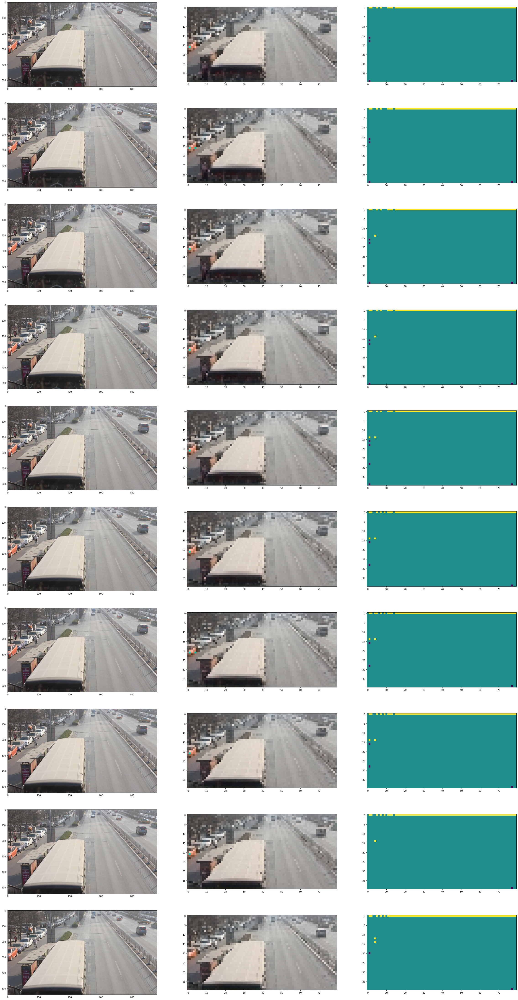

In [12]:

fig = plt.figure(figsize=(40,80))
columns = 3
rows = 10
for i in range(rows):
    for j in range(columns):
        fig.add_subplot(rows,columns,i*columns + j + 1)
        if j == 0:     
            plt.imshow(X_test[i,:,:,:])
        if j == 1:
            plt.imshow(recon_imgs[i])
        if j == 2:
            plt.imshow(arged_imgs[i])
    
plt.show()

In [13]:
## freezing parameter that are unrelated to segmentation, essentially, we only want to train the last few layers
model_dict = dict(model.named_parameters())


for (param, value) in model_dict.items():
    #print(param)
    if 'seg' in param:
        continue
    value.requires_grad = False
    

In [14]:
#import custom loss function, let's see how well things are trained

# Create custom loss function

def calculate_denom(segmented_imgs, weight_matrix):
    # segmented_imgs: torch.Size(N,K,H,W)
    # weight_matrix: torch.Size(N,H,W,HxW)
    # steps:
    # 1. create the expanded matrix
    # 2. multiply with weight_matrix
    # 3. tensor sum wrt depth
    # 4. tensor sum wrt h,w
    # 5. should be a number
    #seg = segmented_imgs
    #seg = torch.tensor(segmented_imgs.data.clone(), requires_grad = True)
    seg = segmented_imgs.clone()
    N,K,H,W = seg.size()
    seg.unsqueeze_(-1)
    seg = seg.expand(-1, -1, -1,-1,H*W)
    assert(seg.size() == torch.Size([N,K,H,W,H*W]))
    assert(weight_matrix.size() == torch.Size([N,K,H,W,H*W]))
    seg = torch.mul(seg, weight_matrix)
    return seg.sum((2,3,4))

def calculate_num(segmented_imgs, weight_matrix):
    # segmented_imgs: torch.Size(N,K,H,W)
    # weight_matrix will be of size (N,H,W,HxW)
    
    N,K,H,W = segmented_imgs.size()
    #seg1 = torch.tensor(segmented_imgs.data.clone(), requires_grad = True)
    #seg2 = torch.tensor(seg1.clone(), requires_grad = True)
    seg1 = segmented_imgs.clone()
    seg2 = segmented_imgs.clone()
    
    seg1.unsqueeze_(-1) # N,K,H,W,1
    seg1 = seg1.expand(-1, -1, -1, -1, H*W)
    seg2.unsqueeze_(-1) # N,K,H,W,1
    seg2 = seg2.reshape(N,K, 1, 1, -1) # N,K,1,1,H*W
    seg2 = seg2.expand(-1,-1, H, W, -1) # N,K,H,W,H*W
    assert(seg1.size() == seg2.size())
    seg1 = torch.mul(seg1, seg2) # N,K,H,W,H*W
    
    seg1 = torch.mul(seg1, weight_matrix) #N,K,H,W,H*W
    return seg1.sum((2,3,4))

def calculate_dist_matrix(N, H, W):
    
    sigma_x_squared = 0.16
    threshold = 3
    #x_matrix1 = torch.arange(end = H, dtype=torch.float, requires_grad=True).cuda()
    x_matrix1 = torch.arange(end = H, dtype=torch.float).cuda()
    
    x_matrix1.unsqueeze_(-1)
    x_matrix1 = x_matrix1.expand(-1, W)
    x_matrix1.unsqueeze_(-1)
    x_matrix1 = x_matrix1.expand(-1,-1,H*W)
    
    #x_matrix2 = torch.arange(end = H, dtype = torch.float, requires_grad = True).cuda()
    x_matrix2 = torch.arange(end = H, dtype = torch.float).cuda()
    x_matrix2.unsqueeze_(-1)
    x_matrix2 = x_matrix2.expand(-1,W)
    x_matrix2.unsqueeze_(-1)
    x_matrix2 = x_matrix2.reshape(1,1,-1)
    x_matrix2 = x_matrix2.expand(H,W,-1)
    
    x_matrix1 = x_matrix1 - x_matrix2
    x_matrix_final = torch.pow(x_matrix1, 2)
    
    #y_matrix1 = torch.arange(end = W, dtype=torch.float, requires_grad=True ).cuda()
    y_matrix1 = torch.arange(end = W, dtype=torch.float).cuda()
    y_matrix1.unsqueeze_(-1)
    y_matrix1 = y_matrix1.expand(-1, H)
    y_matrix1 = y_matrix1.permute(1,0)
    y_matrix1.unsqueeze_(-1)
    y_matrix1 = y_matrix1.expand(-1,-1,H*W)
    
    #y_matrix2 = torch.arange(end = W, dtype = torch.float, requires_grad = True).cuda()
    y_matrix2 = torch.arange(end = W, dtype = torch.float).cuda()
    y_matrix2 = y_matrix2.repeat(H)
    y_matrix2.unsqueeze_(-1)
    y_matrix2.unsqueeze_(-1)
    y_matrix2 = y_matrix2.permute(1,2,0)
    y_matrix2 = y_matrix2.expand(H,W,-1)
    
    y_matrix1 = y_matrix1 - y_matrix2
    y_matrix_final = torch.pow(y_matrix1,2)
    
    dist_diff = torch.exp( -torch.div(x_matrix_final+y_matrix_final, sigma_x_squared) )
    threshold_matrix = x_matrix1 + y_matrix1
    threshold_matrix[threshold_matrix < threshold] = 1
    threshold_matrix[threshold_matrix >= threshold] = 0
    dist_diff = torch.mul(dist_diff, threshold_matrix)
    
    assert(dist_diff.size() == torch.Size([H,W,H*W]))
    dist_diff.unsqueeze_(0)
    dist_diff = dist_diff.expand(N,-1, -1, -1) #N,H,W,H*W

    return dist_diff

def create_weight_matrix(N, H, W, K, dist_diff, original_img):
    # given the corresponding height and width, will create a weight matrix of size H,W,HxW according to the formula given in
    # w-net paper.
    # original_img size: torch.Size(N,C,H,W)
    # dist_diff size: torch.Size(N,H,W,H*W)
    # we will assume matrix of size H, W is given, it is initialized to zeros
    
    sigma_i_squared = 10
     
    #matrix1 = original_img
    #matrix1 = torch.tensor(original_img.clone(), requires_grad = True)
    matrix1 = original_img.clone()
    matrix1.unsqueeze_(-1)
    matrix1 = matrix1.expand(-1,-1,-1,-1,H*W)
    assert(matrix1.size() == torch.Size([N,C,H,W,H*W]))
    
    #matrix2 = torch.tensor(original_img.clone(), requires_grad = True)
    #matrix2 = original_img
    matrix2 = original_img.clone()
    matrix2.unsqueeze_(-1)
    matrix2 = matrix2.reshape(N,C,1,1,-1) #N,C,1,1,H*W
    matrix2 = matrix2.expand(-1,-1,H,W,-1) #N,C,H,W,H*W
    assert(matrix2.size() == torch.Size([N,C,H,W,H*W]))
    matrix1 = matrix1 - matrix2
    matrix1 = torch.pow(matrix1,2) #N,C,H,W,H*W
    
    matrix1 = torch.exp( -torch.div( matrix1.sum(1), sigma_i_squared) ) #N,H,W,H*W
    weight = torch.pow(matrix1, 2) #N,H,W,H*W
    assert(weight.size() == torch.Size([N,H,W,H*W]))
    weight.unsqueeze_(1)
    weight = weight.expand(-1,K,-1,-1,-1) #N,K,H,W,H*W
    
    return weight
    
    
#TODO: Need to convert this to 4d matrix because we expect to pass in multiple samples
def softcut_loss(segmented_imgs, original_imgs, dist_diff_matrix):
    N,K,H,W = segmented_imgs.size()
    loss = 0
    wt = 0
    nt = 0
    dt = 0
    
    weight_matrix = create_weight_matrix(N, H, W, K, dist_diff_matrix, original_imgs)
    
    num = calculate_num(segmented_imgs, weight_matrix)
    denom = calculate_denom(segmented_imgs, weight_matrix)
    
    # returned num, denom is torch.Size([N,K])
    
    total_sum = torch.sum(torch.div(num, denom))
    return N*K - total_sum
    
    
    ### Before batch processing
    """
    for i in range(N):
        segmented_img = segmented_imgs[i,:,:,:]
        original_img = original_imgs[i,:,:,:]
        weight_matrix = create_weight_matrix(N,H,W, dist_diff_matrix, original_img)
        
        frac_sum = 0
        
        #used for profiling
        num_time = 0
        denom_time = 0
        for j in range(K):
            num = calculate_num(segmented_img[j,:,:], weight_matrix)
            
            denom = calculate_denom(segmented_img[j,:,:], weight_matrix)
            frac_sum += num / denom
            
    return K - frac_sum
    """
    ### End

In [15]:
num_epochs = 100
batch_size = 16


n_samples, H, W, C = X_train_norm.shape

train_data = torch.from_numpy(X_train_norm).float()
train_data = train_data.permute(0,3,1,2)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=batch_size, num_workers=4, drop_last=True)

dist_diff_matrix = calculate_dist_matrix(batch_size, H,W)

In [16]:

num_epochs = 20
for epoch in range(num_epochs):
    st = time.perf_counter()
    for i, images in enumerate(train_loader):    # Ignore image labels
        images_cuda = images.cuda()
        recon, seg = model(images_cuda)  
        #print_grad("Before zero_grad") ##

        optimizer.zero_grad()
        #print_grad("After zero_grad") ##
        loss1 = softcut_loss(seg, images_cuda, dist_diff_matrix)
        loss1.backward(retain_graph = True)
        #print_grad("After back prop") ##
        optimizer.step()
        #print_grad("After application")
        optimizer.zero_grad()
        #print_grad("After 2nd zero grad")
        
        #loss2 = distance(recon, images_cuda)
        #loss2.backward()
        #print_grad("After 2nd loss backward")
        #optimizer.step()
        #print_grad("After 2nd grad application")
        
    #print('epoch [{}/{}], loss1:{:.4f}, loss2:{:.4f}, time elapsed:{:.4f} (sec)'.format(epoch+1, num_epochs, loss1.data, loss2.data, time.perf_counter() - st))
    print('epoch [{}/{}], loss1:{:.4f}, time elapsed:{:.4f} (sec)'.format(epoch+1, num_epochs, loss1.data, time.perf_counter() - st))


epoch [1/20], loss1:143.6970, time elapsed:205.5782 (sec)
epoch [2/20], loss1:143.5966, time elapsed:205.6504 (sec)
epoch [3/20], loss1:143.5996, time elapsed:205.6147 (sec)
epoch [4/20], loss1:143.5625, time elapsed:205.3077 (sec)
epoch [5/20], loss1:143.5488, time elapsed:205.4293 (sec)
epoch [6/20], loss1:143.5149, time elapsed:205.3697 (sec)
epoch [7/20], loss1:143.4955, time elapsed:205.5917 (sec)
epoch [8/20], loss1:143.5170, time elapsed:205.4416 (sec)
epoch [9/20], loss1:143.5074, time elapsed:205.5514 (sec)
epoch [10/20], loss1:143.4489, time elapsed:205.5133 (sec)
epoch [11/20], loss1:143.4601, time elapsed:205.6667 (sec)
epoch [12/20], loss1:143.4403, time elapsed:205.5472 (sec)
epoch [13/20], loss1:143.5009, time elapsed:205.4340 (sec)
epoch [14/20], loss1:143.4423, time elapsed:205.6206 (sec)
epoch [15/20], loss1:143.5311, time elapsed:205.3924 (sec)
epoch [16/20], loss1:143.5065, time elapsed:205.3714 (sec)
epoch [17/20], loss1:143.4460, time elapsed:205.5932 (sec)


KeyboardInterrupt: 

In [20]:
offset = 100

X_test_torch = torch.from_numpy(X_test_norm[offset:offset + 10]).float()
test_data = X_test_torch.permute(0,3,1,2)
test_cuda = test_data.cuda()
recon, seged = model(test_cuda)

### recon reshaped
recon_p = recon.permute(0,2,3,1)
print(recon_p.size())

recon_imgs = recon_p.detach().cpu().numpy()
recon_imgs *= 255
recon_imgs = recon_imgs.astype(np.uint8)

# Try to visualize segmented image

print(torch.max(seged))
print(torch.min(seged))

### seg reshaped
N,K,H,W = seged.size()
arged = torch.argmax(seged, dim = 1) #channels is 1
arged = arged * 255 / (K - 1)
arged_imgs = arged.detach().cpu().numpy()

print(recon_p.size())

arged_imgs = arged_imgs.astype(np.uint8)


torch.Size([10, 40, 80, 3])
tensor(1., device='cuda:0', grad_fn=<MaxBackward1>)
tensor(0., device='cuda:0', grad_fn=<MinBackward1>)
torch.Size([10, 40, 80, 3])


In [21]:
arg_tmp = torch.argmax(seged, dim = 1)
arg_tmp_cpu = arg_tmp.detach().cpu().numpy()
n,h,w = arg_tmp_cpu.shape
arg_tmp_reshaped = arg_tmp_cpu.reshape((n,h*w,1))
arg_tmp_reshaped = np.squeeze(arg_tmp_reshaped)
print(arg_tmp_reshaped.shape)
# I want to count for each image how many of each value there is
# Also it seems weird that the max value is 3 - maybe I should do something about distance function
# Also I should try changing the K value?
for i in range(10):
    bins = np.bincount(arg_tmp_reshaped[i,:])
    print(bins)


(10, 3200)
[1170  148    0    0    0    0  810  495  577]
[1193  164    0    0    0    0  787  509  547]
[1158  157    0    0    0    0  823  510  552]
[1169  165    0    0    0    0  797  512  557]
[1209  152    0    0    0    0  779  512  548]
[1195  138    0    0    0    0  794  497  576]
[1180  144    0    0    0    0  798  503  575]
[1190  141    0    0    0    0  802  502  565]
[1179  151    0    0    0    0  775  518  577]
[1210  148    0    0    0    0  771  507  564]


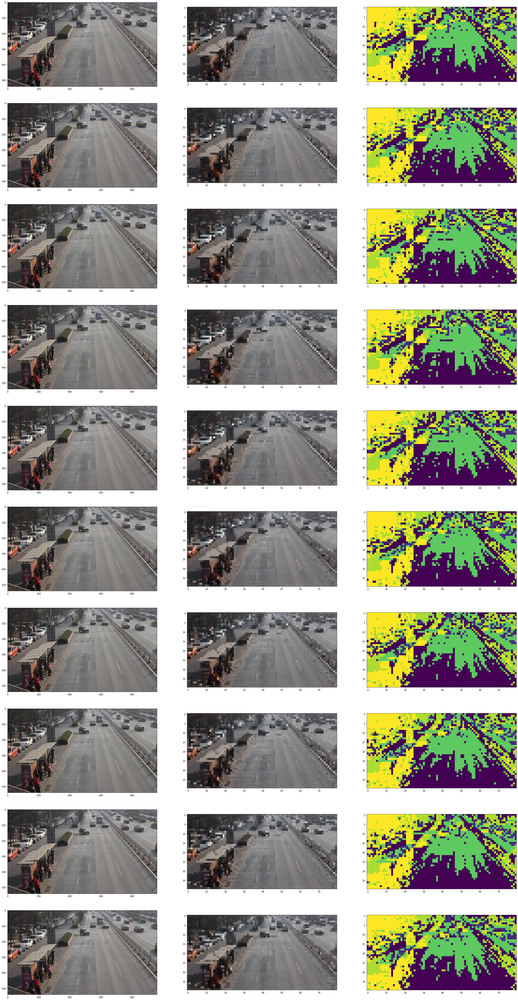

In [23]:
# show results

fig = plt.figure(figsize=(40,80))
columns = 3
rows = 10
for i in range(rows):
    for j in range(columns):
        fig.add_subplot(rows,columns,i*columns + j + 1)
        if j == 0:     
            plt.imshow(X_test[100 + i,:,:,:])
        if j == 1:
            plt.imshow(recon_imgs[i])
        if j == 2:
            plt.imshow(arged_imgs[i])
    
plt.show()

In [108]:
# Compute background through averaging
X_train_mvi = np.copy(X_train[:20,:,:,:])
print(X_train_mvi.shape)

(20, 540, 960, 3)


(540, 960, 3)


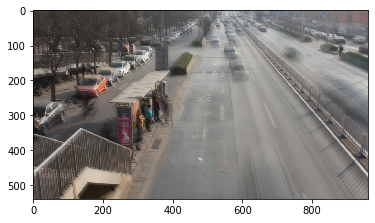

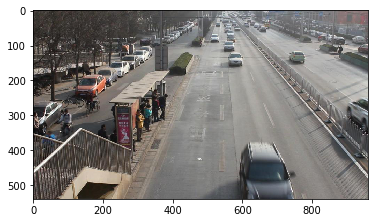

In [109]:
avg = np.average(X_train_mvi, axis = 0)
print(avg_image.shape)
#avg = avg_image * 255.0
avg = avg.astype(np.uint8)

plt.imshow(avg)
plt.show()
plt.imshow(X_train_mvi[0,:,:,:])
plt.show()

(540, 960, 3)


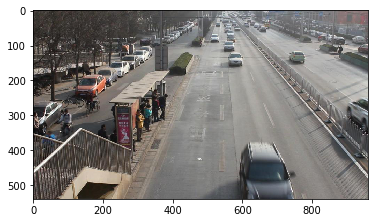

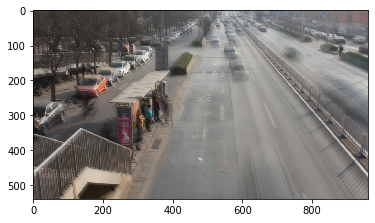

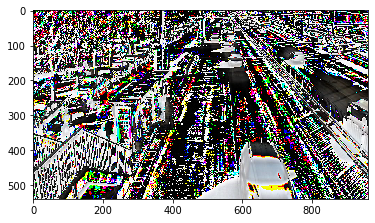

(540, 960)
(540, 960)


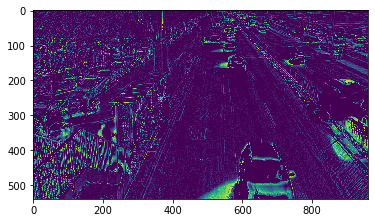

3395


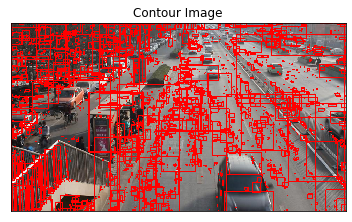

In [246]:
img = np.copy(X_train_mvi[0,:,:,:])
print(img.shape)
img = np.squeeze(img)
plt.imshow(img)
plt.show()
plt.imshow(avg)
plt.show()
img_norm = img / 255.0
avg_norm = avg / 255.0



sub_img = img_norm - avg_norm
sub_img *= 255.0
sub_img = sub_img.astype(np.uint8)
plt.imshow(sub_img)
plt.show()

second = np.copy(X_train_mvi[10,:,:,:])
first = np.copy(X_train_mvi[0,:,:,:])
second = np.squeeze(second)
first = np.squeeze(first)
subbed = second - first
subbed[subbed > 50] = 0
subbed = np.average(subbed, axis = 2)
print(subbed.shape)

subbed = subbed.astype(np.uint8)

print(subbed.shape)
plt.imshow(subbed)
plt.show()

draw_contours(img, subbed, 111)


In [241]:
import cv2
print(cv2.__version__)

from cv2 import ximgproc
from cv2.ximgproc import createEdgeBoxes





4.1.0


In [ ]:
"""edge_detection = cv2.ximgproc.createStructuredEdgeDetection("Sobel")
rgb_im = cv2.cvtColor(im, cv.COLOR_BGR2RGB)
edges = edge_detection.detectEdges(np.float32(img / 255.0))

orimap = edge_detection.computeOrientation(edges)
edges = edge_detection.edgesNms(edges, orimap)
edge_boxes = createEdgeBoxes()
edge_boxes.setMaxBoxes(30)
boxes = edge_boxes.getBoundingBoxes(edges, orimap)

for b in boxes:
    x, y, w, h = b
    cv2.rectangle(im, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)


plt.imshow(edges)
plt.imshow(im)


"""

In [251]:
def _format_image_fixed(X, height, width):
    n_samples,_,_,channels = X.shape
    X_new = np.ndarray(shape=(n_samples, height, width, channels))
    for i in range(n_samples):
        X_new[i] = cv2.resize(X[i],  (width,height))
        
    return X_new


X_mvi_down = _format_image_fixed(X_train[:200,:,:,:], 200, 400)
X_mvi_down = np.average(X_mvi_down, axis = 3)
X_mvi_down = X_mvi_down.astype(np.uint8)
X_mvi_down_no = _format_image_fixed(X_train[:200,:,:,:], 200, 400)
X_mvi_down_no = X_mvi_down_no.astype(np.uint8)


In [150]:
print(X_mvi_down.shape)

(200, 200, 400)


In [267]:
def draw_contours(original_img, img, num):
    import random as rng
    rng.seed(12345)
    import cv2 as cv
    contours, aaaa = cv.findContours(img, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        print("No contours in image")
        return
    
    contours_poly = [None]*len(contours)
    boundRect = [None]*len(contours)
    centers = [None]*len(contours)
    radius = [None]*len(contours)
    for i, c in enumerate(contours):
        contours_poly[i] = cv.approxPolyDP(c, 3, True)
        boundRect[i] = cv.boundingRect(contours_poly[i])
        centers[i], radius[i] = cv.minEnclosingCircle(contours_poly[i])

    drawing = np.copy(original_img)
    
    
    print(len(contours))
    for i in range(len(contours)):
        color = (random.randint(0, 255),random.randint(0, 255),random.randint(0, 255))
        #cv.drawContours(drawing, contours_poly, i, color)
        #cv.rectangle(drawing, (int(boundRect[i][0]), int(boundRect[i][1])), \
        #      (int(boundRect[i][0]+boundRect[i][2]), int(boundRect[i][1]+boundRect[i][3])), color, 2)
        cv.circle(drawing, (int(centers[i][0]), int(centers[i][1])), int(radius[i]), color, 2)

    plt.subplot(num), plt.imshow(drawing)
    plt.title('Contour Image'), plt.xticks([]), plt.yticks([])
    
    return

Done training, took 0.43869495391845703 seconds
98


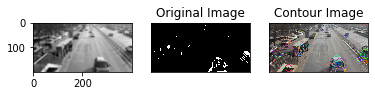

89


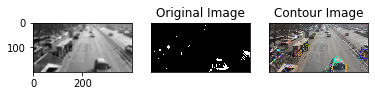

77


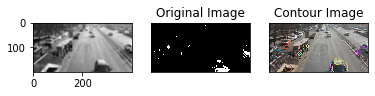

67


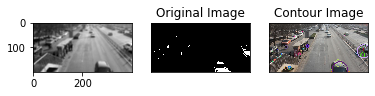

62


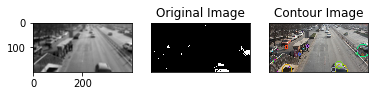

64


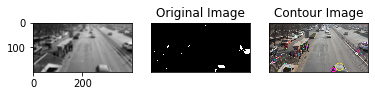

68


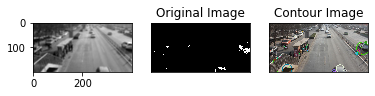

58


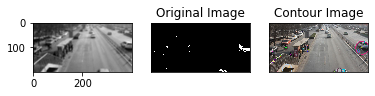

53


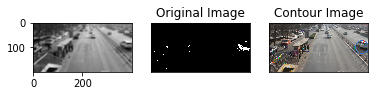

57


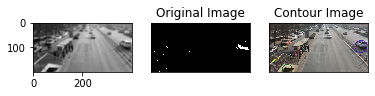

58


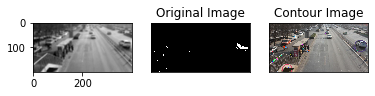

51


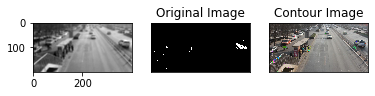

50


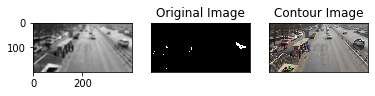

46


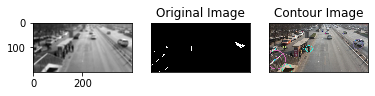

69


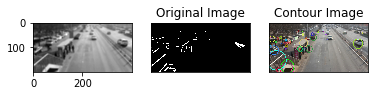

109


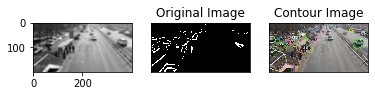

103


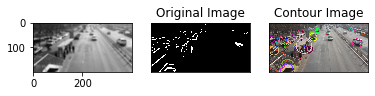

90


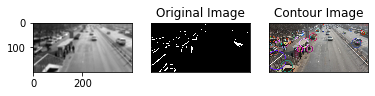

71


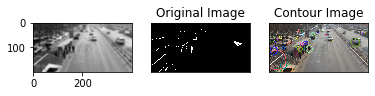

64


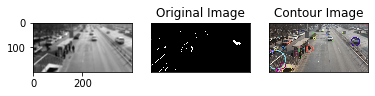

In [273]:
### Video Background Subtraction Using Opencv

import numpy as np
import cv2

#fgbg = cv2.bgsegm.createBackgroundSubtractorCNT(minPixelStability=50)
#fgbg = cv2.bgsegm.createBackgroundSubtractorGSOC(mc = cv2.bgsegm.LSBP_CAMERA_MOTION_COMPENSATION_LK, hitsThreshold = 30)
#fgbg.apply(X_mvi_down[0,:,:])
fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()

# Training step

st = time.time()
for i in range(200):
    src_gray = cv2.blur(X_mvi_down[i,:,:], (3,3))
    fgmask = fgbg.apply(src_gray)
    
print("Done training, took", time.time() - st, "seconds")
    
for i in range(20):
    src_gray = cv2.blur(X_mvi_down[i,:,:], (7,7))
    fgmask = fgbg.apply(src_gray)
    
    
    edges = cv2.Canny(fgmask, 100, 200)
    plt.subplot(131), plt.imshow(src_gray, cmap = 'gray')
    plt.subplot(132),plt.imshow(fgmask,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    #plt.subplot(143),plt.imshow(edges,cmap = 'gray')
    #plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    draw_contours(X_mvi_down_no[i,:,:], fgmask, 133)
    plt.show()





In [152]:
fgmask = fgbg.apply(X_mvi_down[i,:,:])


(200, 400)


In [361]:
'i{}.{}'.format(123,456)

'i123.456'

## Trying out AIR for UA-DETRAC


In [382]:
import os
from collections import namedtuple
import pyro
import pyro.optim as optim
from pyro.infer import SVI, TraceGraph_ELBO
import pyro.distributions as dist
import pyro.poutine as poutine
import torch
import torch.nn as nn
from torch.nn.functional import relu, softplus, grid_sample, affine_grid
import numpy as np

smoke_test = ('CI' in os.environ)
print(pyro.__version__)
pyro.enable_validation(True)

0.3.3


In [383]:
# Create the neural network. This takes a latent code, z_what, to pixel intensities.
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.l1 = nn.Linear(50, 200)
        self.l2 = nn.Linear(200, 400)

    def forward(self, z_what):
        h = relu(self.l1(z_what))
        sig = nn.Sigmoid()
        return sig(self.l2(h))

decode = Decoder()

z_where_prior_loc = torch.tensor([3., 0., 0.])
z_where_prior_scale = torch.tensor([0.1, 1., 1.])
z_what_prior_loc = torch.zeros(50)
z_what_prior_scale = torch.ones(50)

def prior_step_sketch(t):
    # Sample object pose. This is a 3-dimensional vector representing x,y position and size.
    z_where = pyro.sample('z_where_{}'.format(t),
                          dist.Normal(z_where_prior_loc.expand(1, -1),
                                      z_where_prior_scale.expand(1, -1))
                              .to_event(1))

    # Sample object code. This is a 50-dimensional vector.
    z_what = pyro.sample('z_what_{}'.format(t),
                         dist.Normal(z_what_prior_loc.expand(1, -1),
                                     z_what_prior_scale.expand(1, -1))
                             .to_event(1))

    # Map code to pixel space using the neural network.
    y_att = decode(z_what)

    # Position/scale object within larger image.
    y = object_to_image(z_where, y_att)

    return y

In [384]:
def expand_z_where(z_where):
    # Takes 3-dimensional vectors, and massages them into 2x3 matrices with elements like so:
    # [s,x,y] -> [[s,0,x],
    #             [0,s,y]]
    n = z_where.size(0)
    expansion_indices = torch.LongTensor([1, 0, 2, 0, 1, 3])
    out = torch.cat((torch.zeros([1, 1]).expand(n, 1), z_where), 1)
    return torch.index_select(out, 1, expansion_indices).view(n, 2, 3)

def object_to_image(z_where, obj):
    n = obj.size(0)
    theta = expand_z_where(z_where)
    grid = affine_grid(theta, torch.Size((n, 1, 50, 50)))
    out = grid_sample(obj.view(n, 1, 20, 20), grid)
    return out.view(n, 50, 50)

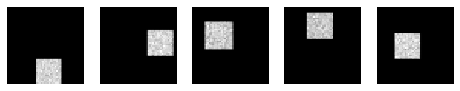

In [385]:
def show_images(imgs):
    figure(figsize=(8, 2))
    for i, img in enumerate(imgs):
        subplot(1, len(imgs), i + 1)
        axis('off')
        imshow(img.data.numpy(), cmap='gray')

pyro.set_rng_seed(0)
samples = [prior_step_sketch(0)[0] for _ in range(5)]
show_images(samples)

In [386]:
pyro.set_rng_seed(0)
def geom(num_trials=0):
    p = torch.tensor([0.5])
    x = pyro.sample('x{}'.format(num_trials), dist.Bernoulli(p))
    if x[0] == 1:
        return num_trials
    else:
        return geom(num_trials + 1)

# Generate some samples.
for _ in range(5):
    print('sampled {}'.format(geom()))

sampled 0
sampled 1
sampled 0
sampled 0
sampled 1


In [387]:
def geom_prior(x, step=0):
    p = torch.tensor([0.2])
    i = pyro.sample('i{}'.format(step), dist.Bernoulli(p))
    if i[0] == 1:
        return x
    else:
        x = x + prior_step_sketch(step)
        return geom_prior(x, step + 1)

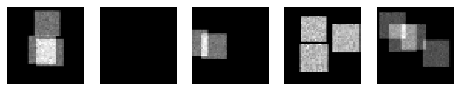

In [388]:
pyro.set_rng_seed(4)
x_empty = torch.zeros(1, 50, 50)
samples = [geom_prior(x_empty)[0] for _ in range(5)]
show_images(samples)

In [389]:
def prior_step(n, t, prev_x, prev_z_pres):

    # Sample variable indicating whether to add this object to the output.

    # We multiply the success probability of 0.5 by the value sampled for this
    # choice in the previous step. By doing so we add objects to the output until
    # the first 0 is sampled, after which we add no further objects.
    z_pres = pyro.sample('z_pres_{}'.format(t),
                         dist.Bernoulli(0.99 * prev_z_pres)
                             .to_event(1))

    z_where = pyro.sample('z_where_{}'.format(t),
                          dist.Normal(z_where_prior_loc.expand(n, -1),
                                      z_where_prior_scale.expand(n, -1))
                              .mask(z_pres)
                              .to_event(1))

    z_what = pyro.sample('z_what_{}'.format(t),
                         dist.Normal(z_what_prior_loc.expand(n, -1),
                                     z_what_prior_scale.expand(n, -1))
                             .mask(z_pres)
                             .to_event(1))

    y_att = decode(z_what)
    y = object_to_image(z_where, y_att)

    # Combine the image generated at this step with the image so far.
    x = prev_x + y * z_pres.view(-1, 1, 1)

    return x, z_pres

In [390]:
def prior(n):
    x = torch.zeros(n, 50, 50)
    z_pres = torch.ones(n, 1)
    for t in range(10):
        x, z_pres = prior_step(n, t, x, z_pres)
    return x

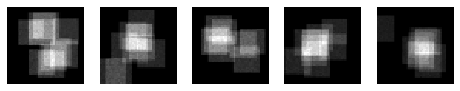

In [391]:
pyro.set_rng_seed(121)
show_images(prior(5))

In [392]:
def model(data):
    # Register network for optimization.
    pyro.module("decode", decode)
    with pyro.plate('data', data.size(0)) as indices:
        batch = data[indices]
        x = prior(batch.size(0)).view(-1, 50 * 50)
        sd = (0.3 * torch.ones(1)).expand_as(x)
        pyro.sample('obs', dist.Normal(x, sd).to_event(1),
                    obs=batch)

In [399]:
rnn = nn.LSTMCell(2554, 256)

# Takes pixel intensities of the attention window to parameters (mean,
# standard deviation) of the distribution over the latent code,
# z_what.
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.l1 = nn.Linear(400, 200)
        self.l2 = nn.Linear(200, 100)

    def forward(self, data):
        h = relu(self.l1(data))
        a = self.l2(h)
        return a[:, 0:50], softplus(a[:, 50:])

encode = Encoder()

# Takes the guide RNN hidden state to parameters of
# the guide distributions over z_where and z_pres.
class Predict(nn.Module):
    def __init__(self, ):
        super(Predict, self).__init__()
        self.l = nn.Linear(256, 7)

    def forward(self, h):
        a = self.l(h)
        sig = nn.Sigmoid()
        z_pres_p = sig(a[:, 0:1]) # Squish to [0,1]
        z_where_loc = a[:, 1:4]
        z_where_scale = softplus(a[:, 4:]) # Squish to >0
        return z_pres_p, z_where_loc, z_where_scale

predict = Predict()


In [400]:
def z_where_inv(z_where):
    # Take a batch of z_where vectors, and compute their "inverse".
    # That is, for each row compute:
    # [s,x,y] -> [1/s,-x/s,-y/s]
    # These are the parameters required to perform the inverse of the
    # spatial transform performed in the generative model.
    n = z_where.size(0)
    out = torch.cat((torch.ones([1, 1]).type_as(z_where).expand(n, 1), -z_where[:, 1:]), 1)
    out = out / z_where[:, 0:1]
    return out

def image_to_object(z_where, image):
    n = image.size(0)
    theta_inv = expand_z_where(z_where_inv(z_where))
    grid = affine_grid(theta_inv, torch.Size((n, 1, 20, 20)))
    out = grid_sample(image.view(n, 1, 50, 50), grid)
    return out.view(n, -1)

In [401]:
bl_rnn = nn.LSTMCell(2554, 256)
bl_predict = nn.Linear(256, 1)

# Use an RNN to compute the baseline value. This network takes the
# input images and the values samples so far as input.
def baseline_step(x, prev):
    rnn_input = torch.cat((x,
                           prev.z_where.detach(),
                           prev.z_what.detach(),
                           prev.z_pres.detach()), 1)
    bl_h, bl_c = bl_rnn(rnn_input, (prev.bl_h, prev.bl_c))
    bl_value = bl_predict(bl_h) * prev.z_pres
    return bl_value, bl_h, bl_c

In [402]:
GuideState = namedtuple('GuideState', ['h', 'c', 'bl_h', 'bl_c', 'z_pres', 'z_where', 'z_what'])
def initial_guide_state(n):
    return GuideState(h=torch.zeros(n, 256),
                      c=torch.zeros(n, 256),
                      bl_h=torch.zeros(n, 256),
                      bl_c=torch.zeros(n, 256),
                      z_pres=torch.ones(n, 1),
                      z_where=torch.zeros(n, 3),
                      z_what=torch.zeros(n, 50))

def guide_step(t, data, prev):
    
    # Using the data input, we compute the h, c values (h value is hidden state, c is cell state)
    rnn_input = torch.cat((data, prev.z_where, prev.z_what, prev.z_pres), 1)
    h, c = rnn(rnn_input, (prev.h, prev.c))
    z_pres_p, z_where_loc, z_where_scale = predict(h)

    # Here we compute the baseline value, and pass it to sample.
    baseline_value, bl_h, bl_c = baseline_step(data, prev)
    z_pres = pyro.sample('z_pres_{}'.format(t),
                         dist.Bernoulli(z_pres_p * prev.z_pres)
                             .to_event(1),
                         infer=dict(baseline=dict(baseline_value=baseline_value.squeeze(-1))))

    z_where = pyro.sample('z_where_{}'.format(t),
                          dist.Normal(z_where_loc, z_where_scale)
                              .mask(z_pres)
                              .to_event(1))

    x_att = image_to_object(z_where, data)

    z_what_loc, z_what_scale = encode(x_att)

    z_what = pyro.sample('z_what_{}'.format(t),
                         dist.Normal(z_what_loc, z_what_scale)
                             .mask(z_pres)
                             .to_event(1))

    return GuideState(h=h, c=c, bl_h=bl_h, bl_c=bl_c, z_pres=z_pres, z_where=z_where, z_what=z_what)

def guide(data):
    # Register networks for optimization.
    pyro.module('rnn', rnn),
    pyro.module('predict', predict),
    pyro.module('encode', encode),
    pyro.module('bl_rnn', bl_rnn)
    pyro.module('bl_predict', bl_predict)

    with pyro.plate('data', data.size(0), subsample_size=64) as indices:
        batch = data[indices]
        state = initial_guide_state(batch.size(0))
        steps = []
        for t in range(10):
            state = guide_step(t, batch, state)
            steps.append(state)
        return steps

In [327]:
n, c, h, w = X_train_norm.shape
print(X_train_norm.shape)


def _format_image_fixed1(X, height, width):
    #resize and black and white
    n_samples,_,_,channels = X.shape
    X_new = np.ndarray(shape=(n_samples, height, width, channels))
    for i in range(n_samples):
        X_new[i] = cv2.resize(X[i],  (width,height))

    X_new = np.average(X_new, axis = 3)
        
    return X_new

X_train_norm = _format_image_fixed1(X_train_norm, 50, 50)

ValueError: not enough values to unpack (expected 4, got 3)

In [403]:
print(X_train_norm.shape)

(8336, 50, 50)


In [ ]:

n,h,w = X_train_norm.shape
data = torch.from_numpy(X_train_norm).float()
print(data.type())
data = data.view(n,h*w)

svi = SVI(model,
          guide,
          optim.Adam({'lr': 1e-4}),
          loss=TraceGraph_ELBO())

losses = []
for i in range(10000):
    loss = svi.step(data)
    losses.append(loss)
    print('i={}, elbo={:.2f}'.format(i, loss / data.size(0)))
    

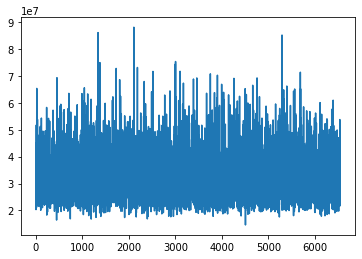

In [405]:
# Graph the losses

plt.plot(losses)


In [ ]:
# Now feed in test data and see how it performs
# we need to use the pyro.param function to extract the actual model

output = 

In [ ]:
# Canny edge detection

sample_test_data = np.copy(X_test[0:10,:,:,:])

for i in range(10):
    img = sample_test_data[i,:,:,:]
    img = np.squeeze(img)
    edges = cv2.Canny(img, 100, 200)
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()



In [ ]:
# let's try subtracting and and then canny detection

for i in range(9):
    sub_img = sample_test_data[i + 1,:,:,:] - sample_test_data[i, :, :, :]
    sub_img = np.squeeze(sub_img)
    edges = cv2.Canny(sub_img, 100, 200)
    img = sub_img
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()

In [ ]:
def _format_image_fixed(X, height, width):
    n_samples,_,_,channels = X.shape
    X_new = np.ndarray(shape=(n_samples, height, width, channels), dtype = np.uint8)
    for i in range(n_samples):
        X_new[i] = cv2.resize(X[i],  (width,height))
        
    return X_new

new_test_data = _format_image_fixed(sample_test_data, 48, 80)
print(new_test_data.shape)

for i in range(10):
    img = new_test_data[i,:,:,:]
    img = np.squeeze(img)
    edges = cv2.Canny(img, 100, 200)
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()


In [58]:
n,h,w,c = X_test.shape

#extract evenly distributed images
n = 20
background_test = np.ndarray(shape = ())
background_test = X_test[]


(2085, 540, 960, 3)

(10, 48, 80, 3)
(48, 80, 3)


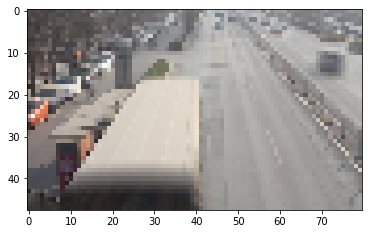

In [57]:
new_test_data = _format_image_fixed(sample_test_data, 48, 80)
print(new_test_data.shape)


n, h, w, c = new_test_data.shape
avg_img = np.sum(new_test_data, axis = 0) / n
avg_img = avg_img.astype(np.uint8)
print(avg_img.shape)

plt.imshow(avg_img)
plt.show()


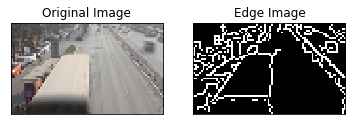

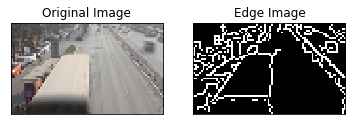

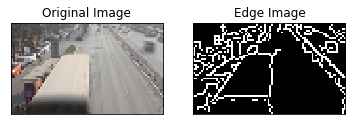

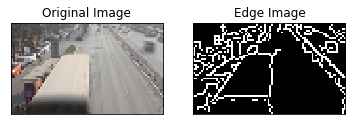

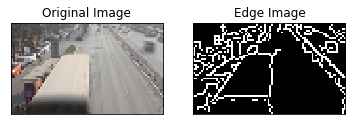

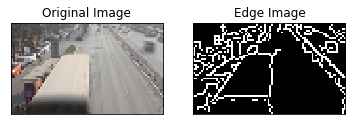

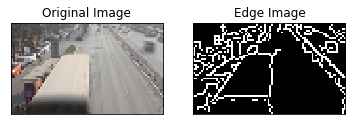

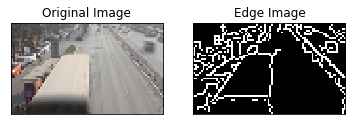

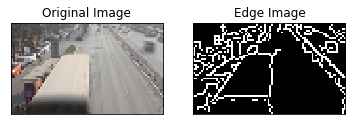

In [59]:

for i in range(9):
    img = new_test_data[i,:,:,:]
    img2 = avg_img
    img = np.squeeze(img)
    img2 = np.squeeze(img2)
    img_sub = img - img2
    img_sub = img - img_sub
    img_sub.astype(np.uint8)
    #img_sub[img_sub > 250] = 0
    
    edges = cv2.Canny(img_sub, 100, 200)
    plt.subplot(121),plt.imshow(img_sub,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()
